# **DETECTION OF SCHIZOPHRENIA USING MACHINE LEARNING**





##**1. Visualizing the EEG data**



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
def eeg_plotter(file):
    df = pd.read_csv(file,header=None)
    
    x1 = np.asarray(df[0])[:7680]
    x2 = np.asarray(df[0])[7680:15360]
    x3 = np.asarray(df[0])[15360:23040]
    x4 = np.asarray(df[0])[23040:30720]
    x5 = np.asarray(df[0])[30720:38400]
    x6 = np.asarray(df[0])[38400:46080]
    x7 = np.asarray(df[0])[46080:53760]
    x8 = np.asarray(df[0])[53760:61440]
    x9 = np.asarray(df[0])[61440:69120]
    x10 = np.asarray(df[0])[69120:76800]
    x11 = np.asarray(df[0])[76800:84480]
    x12 = np.asarray(df[0])[84480:92160]
    x13 = np.asarray(df[0])[92160:99840]
    x14 = np.asarray(df[0])[99840:107520]
    x15 = np.asarray(df[0])[107520:115200]
    x16 = np.asarray(df[0])[115200:122880]
    
    y = np.arange(0,7680,1)
    
    img = plt.figure(figsize=(80, 20))
    plt.plot(y,x1+1500*0,color='blue')
    plt.plot(y,x2+1500*1,color='red')
    plt.plot(y,x2+1500*2,color='purple')
    plt.plot(y,x2+1500*3,color='green')
    plt.plot(y,x2+1500*4,color='magenta')
    plt.plot(y,x2+1500*5,color='brown')
    plt.plot(y,x2+1500*6,color='cyan')
    plt.plot(y,x2+1500*7,color='blue')
    plt.plot(y,x2+1500*8,color='red')
    plt.plot(y,x2+1500*9,color='purple')
    plt.plot(y,x2+1500*10,color='green')
    plt.plot(y,x2+1500*11,color='magenta')
    plt.plot(y,x2+1500*12,color='brown')
    plt.plot(y,x2+1500*13,color='cyan')
    plt.plot(y,x2+1500*14,color='blue')
    plt.plot(y,x2+1500*15,color='red')
    #name = file.split('/')[-1]
    #plt.savefig("/content/drive/MyDrive/Cleaner/images/"+ pType +name+'.png',bbox_inches='tight', pad_inches=0)
    #return img


print("For healthy patients")
eeg_plotter('/content/drive/MyDrive/Major_Project/python_code_major/healthy/S196W1.eea')

print("For SZ patients")
eeg_plotter('/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/33w1.eea')

Output hidden; open in https://colab.research.google.com to view.

## **2. Using KNN on the EEG data to predict labels**




In [ ]:
def flatten_signal(file,val):
    df = pd.read_csv(file,header=None)
    array = np.array(df)
    array = np.reshape(array,(122880,))
    array = np.append(array,val)
    return array

In [ ]:
channels = ["F7","F3","F4","F8","T3","C3","Cz","C4","T4","T5","P3","Pz","P4","T6","O1","O2"]
columns = []

In [ ]:
#0-7680 length, reset counter to next channel and append i to it
def create_col_list(channels,columns):
    for i in range(len(channels)):
        ch = channels[i]
        for j in range(7680):
            columns.append(ch+"_"+str(j+1))
    columns.append("Schizophrenic")
    return columns

In [ ]:
columns = create_col_list(channels,columns)

In [ ]:
df = pd.DataFrame(columns=columns)

In [ ]:
def add_records_df(df,array):
    df = df.append(pd.DataFrame(array.reshape(1,-1), columns=list(df)), ignore_index=True)
    return df

In [ ]:
def create_df(group,df,val):
    for i in range(len(group)):
        array = flatten_signal(group[i],val)
        df = add_records_df(df,array)
    return df

In [ ]:
df1 = create_df(healthy_patients,df,0)

In [ ]:
df1.head()

,F7_1,F7_2,F7_3,F7_4,F7_5,F7_6,F7_7,F7_8,F7_9,F7_10,...,O2_7672,O2_7673,O2_7674,O2_7675,O2_7676,O2_7677,O2_7678,O2_7679,O2_7680,Schizophrenic
0,347.78,507.87,488.54,369.86,347.78,408.50,488.54,449.90,369.86,427.82,...,278.77,347.78,309.14,27.60,-110.41,-430.58,-571.35,-632.07,-521.67,0.0
1,-30.06,-70.74,-90.19,29.18,229.90,249.35,9.73,-110.53,-390.83,-430.62,...,-560.60,-430.62,-340.43,-350.15,-270.57,79.58,279.41,439.46,399.67,0.0
2,89.53,129.06,269.74,309.27,309.27,209.28,-70.92,-251.14,-370.89,-290.67,...,119.76,-10.46,-60.46,-201.14,-190.68,-730.16,-570.87,-30.23,219.75,0.0
3,228.97,69.32,-170.15,-191.16,-210.06,-151.25,-111.33,-151.25,-331.90,-350.81,...,-1390.62,-691.11,-430.63,-191.16,-81.92,199.56,388.62,258.38,-21.01,0.0
4,148.97,109.99,48.73,29.24,69.61,109.99,189.35,208.84,169.86,29.24,...,318.83,79.36,-11.14,-190.74,-270.10,-391.23,-410.72,-370.35,-270.10,0.0


In [ ]:
df1 = create_df(schizophrenic_patients,df1,1)

In [ ]:
df1.tail()

,F7_1,F7_2,F7_3,F7_4,F7_5,F7_6,F7_7,F7_8,F7_9,F7_10,...,O2_7672,O2_7673,O2_7674,O2_7675,O2_7676,O2_7677,O2_7678,O2_7679,O2_7680,Schizophrenic
79,289.13,109.76,29.45,-30.79,-30.79,-111.10,-111.10,-10.71,228.89,170.00,...,159.29,18.74,119.13,418.96,639.82,639.82,479.20,199.44,-70.94,1.0
80,-51.28,-350.15,-470.41,-450.95,-390.83,-330.70,-210.44,-90.19,-30.06,-10.61,...,339.54,698.53,1059.30,1338.71,1469.57,1538.54,1508.48,1239.68,859.46,1.0
81,-91.23,-70.96,-30.41,8.11,129.75,148.00,8.11,-170.30,-391.28,-551.44,...,18.25,119.61,239.23,368.98,399.39,429.80,539.28,739.99,798.78,1.0
82,-50.11,108.94,229.86,229.86,229.86,229.86,229.86,149.25,29.41,-50.11,...,-410.70,-530.54,-350.79,-70.81,-10.89,69.72,259.28,469.53,589.36,1.0
83,389.43,389.43,426.52,468.24,547.05,486.79,227.17,148.35,148.35,148.35,...,139.08,18.54,-74.18,9.27,-23.18,106.63,157.63,78.81,-13.91,1.0


In [ ]:
new_df = df1.sample(frac=1,random_state=5)

In [ ]:
new_df.head()

,F7_1,F7_2,F7_3,F7_4,F7_5,F7_6,F7_7,F7_8,F7_9,F7_10,...,O2_7672,O2_7673,O2_7674,O2_7675,O2_7676,O2_7677,O2_7678,O2_7679,O2_7680,Schizophrenic
82,-50.11,108.94,229.86,229.86,229.86,229.86,229.86,149.25,29.41,-50.11,...,-410.70,-530.54,-350.79,-70.81,-10.89,69.72,259.28,469.53,589.36,1.0
10,8.95,-10.07,-170.04,-250.59,-350.16,-330.02,-151.03,-50.34,8.95,-50.34,...,-130.89,-350.16,-390.43,-210.32,-30.21,219.27,279.68,199.13,99.57,0.0
28,409.33,389.94,629.08,728.18,769.11,788.50,667.86,489.04,168.04,129.26,...,-922.07,-1411.11,-1680.41,-1740.73,-1281.85,-51.70,308.08,829.43,939.31,0.0
69,84.40,129.85,149.33,188.28,227.23,149.33,6.49,-12.98,-71.42,-155.82,...,-90.89,-473.95,-590.81,-766.11,-876.48,-980.36,-954.39,-694.69,-571.33,1.0
24,468.59,289.67,-10.65,-110.76,-110.76,-31.95,168.27,249.20,349.31,308.84,...,-440.90,-270.50,-31.95,198.09,268.37,438.77,609.16,739.09,719.92,0.0


In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(new_df, test_size=0.2,random_state = 3)

In [ ]:
print(len(train),len(test))

67 17


In [ ]:
y_train = train["Schizophrenic"]
y_test = test["Schizophrenic"]

In [ ]:
x_train = train.drop(columns=["Schizophrenic"],axis=0)
x_test = test.drop(columns=["Schizophrenic"],axis=0)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=7)

In [ ]:
y = knn.predict(x_test)

In [ ]:
print(y)
len(y)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


17

In [ ]:
print(y_test)
len(y_test)

83    1.0
73    1.0
49    1.0
39    1.0
50    1.0
27    0.0
61    1.0
0     0.0
9     0.0
23    0.0
31    0.0
33    0.0
36    0.0
17    0.0
32    0.0
63    1.0
24    0.0
Name: Schizophrenic, dtype: float64


17

In [ ]:
np.sum(y==y_test)

7

In [ ]:
acc = np.sum(y==y_test)/len(y)
print(acc)

0.4117647058823529


0.5769230769230769 - KNN=3 and 70:30

0.5882352941176471 - KNN=7 and 80:20


In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression().fit(x_train, y_train)

In [ ]:
y = lr.predict(x_test)

In [ ]:
np.sum(y==y_test)
acc = np.sum(y==y_test)/len(y)
print(acc)

0.5294117647058824


## **3. Creating Wavelet Transform Images**





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from os import listdir
from os.path import isfile, join

def get_file_names():

    norm_files = [f for f in listdir('/content/drive/MyDrive/Major_Project/python_code_major/healthy') ]
    schiz_files = [f for f in listdir('/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic') ]
    schiz_list=[]
    for item in schiz_files:
        newl='/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/'+item
        schiz_list.append(newl)
    norm_list=[]
    for item in norm_files:
        newl='/content/drive/MyDrive/Major_Project/python_code_major/healthy/'+item
        norm_list.append(newl)

    compiled_list = [*schiz_list, *norm_list]
    return compiled_list
ans=get_file_names()
print(ans)

['/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/33w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/155w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/517w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/485w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/312w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/088w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/276w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/382w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/221w.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/510-1W.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/683w1.eea', '/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/575w1.eea', '/content/drive/

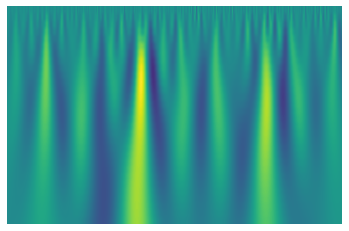

In [ ]:
'''540 window size for cwt 7560/540=14 => about 14 images per test subjects per electrode
In the dataset 84 individuals are there so overall 1176 images per electrode hence total size
of dataset is 18,816 images. The size of each image is about 33kb which means total data set size is 620,928 kb
which is 607 Mb approx. '''

# naming convention of image file is pernum_schiz/norm_electrode number_image window number
#eg- per1_norm_14_8
import os
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import csv

num=57
comp_list = get_file_names()
eff_list = comp_list[56:57]
results_dir = '/content/drive/MyDrive/Major_Project/python_code_major/image_dataset/'
for item in eff_list:
    file = open(item)
    csvreader = csv.reader(file)
    part1='per'+str(num)+'_'
    num+=1
    if 'schizophrenic' in item:
        part2='schiz_'
    elif 'healthy' in item:
        part2='norm_'
    xmain = []
    for row in csvreader:
        xmain.append(float(row[0]))
    first = 0
    last = 7560
    for j in range(0,16):
      if(j>=6):
          part3=str(j+1)+'_'
          x=xmain[first:last]
          nested_first=0
          nested_last = 540
          for i in range (0,14):
              part4=str(i+1)
              y=x[nested_first:nested_last]
              t = np.linspace(-1, 1, 200, endpoint=False)
              sig  = np.cos(2 * np.pi * 7 * t) + signal.gausspulse(t - 0.4, fc=2)
              widths = np.arange(1, 31)
              cwtmatr = signal.cwt(y, signal.ricker, widths)
              plt.imshow(cwtmatr, extent=[-1, 1, 31, 1], aspect='auto',
                        vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())

              plt.axis('off')
              title = part1 + part2 + part3 + part4
              plt.savefig(results_dir+title, bbox_inches='tight',pad_inches = 0)
              nested_first=nested_last
              nested_last=nested_last+540
          first = last
          last= last+7560
      else:
          continue

In [ ]:
from os import listdir
from os.path import isfile, join
Image_names = [f for f in listdir('/content/drive/MyDrive/Major_Project/python_code_major/image_dataset') ]
print(Image_names)

['per57_norm_7_1.png', 'per57_norm_7_2.png', 'per57_norm_7_3.png', 'per57_norm_7_4.png', 'per57_norm_7_5.png', 'per57_norm_7_6.png', 'per57_norm_7_7.png', 'per57_norm_7_8.png', 'per57_norm_7_9.png', 'per57_norm_7_10.png', 'per57_norm_7_11.png', 'per57_norm_7_12.png', 'per57_norm_7_13.png', 'per57_norm_7_14.png', 'per57_norm_8_1.png', 'per57_norm_8_2.png', 'per57_norm_8_3.png', 'per57_norm_8_4.png', 'per57_norm_8_5.png', 'per57_norm_8_6.png', 'per57_norm_8_7.png', 'per57_norm_8_8.png', 'per57_norm_8_9.png', 'per57_norm_8_10.png', 'per57_norm_8_11.png', 'per57_norm_8_12.png', 'per57_norm_8_13.png', 'per57_norm_8_14.png', 'per57_norm_9_1.png', 'per57_norm_9_2.png', 'per57_norm_9_3.png', 'per57_norm_9_4.png', 'per57_norm_9_5.png', 'per57_norm_9_6.png', 'per57_norm_9_7.png', 'per57_norm_9_8.png', 'per57_norm_9_9.png', 'per57_norm_9_10.png', 'per57_norm_9_11.png', 'per57_norm_9_12.png', 'per57_norm_9_13.png', 'per57_norm_9_14.png', 'per57_norm_10_1.png', 'per57_norm_10_2.png', 'per57_norm_10

In [ ]:
import shutil
#Image_names.remove('.DS_Store')
filebefore = '/content/drive/MyDrive/Major_Project/python_code_major/image_dataset/'
fileafter = '/content/drive/MyDrive/Major_Project/python_code_major/cone_electrode_separated_data/electrode_'
for name in Image_names:
  blah=name.split('_')
  orig=filebefore+name
  print(blah)
  if(int(blah[2])==1):
    newn=fileafter+'1/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==2):
    newn=fileafter+'2/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==3):
    newn=fileafter+'3/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==4):
    newn=fileafter+'4/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==5):
    newn=fileafter+'5/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==6):
    newn=fileafter+'6/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==7):
    newn=fileafter+'7/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==8):
    newn=fileafter+'8/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==9):
    newn=fileafter+'9/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==10):
    newn=fileafter+'10/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==11):
    newn=fileafter+'11/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==12):
    newn=fileafter+'12/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==13):
    newn=fileafter+'13/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==14):
    newn=fileafter+'14/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==15):
    newn=fileafter+'15/'+name
    shutil.copyfile(orig,newn)
  elif(int(blah[2])==16):
    newn=fileafter+'16/'+name
    shutil.copyfile(orig,newn)

['per57', 'norm', '7', '1.png']
['per57', 'norm', '7', '2.png']
['per57', 'norm', '7', '3.png']
['per57', 'norm', '7', '4.png']
['per57', 'norm', '7', '5.png']
['per57', 'norm', '7', '6.png']
['per57', 'norm', '7', '7.png']
['per57', 'norm', '7', '8.png']
['per57', 'norm', '7', '9.png']
['per57', 'norm', '7', '10.png']
['per57', 'norm', '7', '11.png']
['per57', 'norm', '7', '12.png']
['per57', 'norm', '7', '13.png']
['per57', 'norm', '7', '14.png']
['per57', 'norm', '8', '1.png']
['per57', 'norm', '8', '2.png']
['per57', 'norm', '8', '3.png']
['per57', 'norm', '8', '4.png']
['per57', 'norm', '8', '5.png']
['per57', 'norm', '8', '6.png']
['per57', 'norm', '8', '7.png']
['per57', 'norm', '8', '8.png']
['per57', 'norm', '8', '9.png']
['per57', 'norm', '8', '10.png']
['per57', 'norm', '8', '11.png']
['per57', 'norm', '8', '12.png']
['per57', 'norm', '8', '13.png']
['per57', 'norm', '8', '14.png']
['per57', 'norm', '9', '1.png']
['per57', 'norm', '9', '2.png']
['per57', 'norm', '9', '3.png'

## **4. Training the temporal time series electrode wise**


In [ ]:
import tensorflow as tf
import os
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np

def load_images(path):
    image = tf.io.read_file(path)
    image = tf.io.decode_jpeg(image)
    image = image[:,:,:3]
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, (326,725))
    image = image/255.0
    return image


In [ ]:
from os import listdir
import numpy as np
from skimage import data, io, filters
filebefore = '/content/drive/MyDrive/scalograms/scal_images/'
elec_1_list = [f for f in listdir('/content/drive/MyDrive/scalograms/scal_images') ]
Y = [] 
X = []
total=len(elec_1_list)
i=1
n=0
m=0
finlist = []
for item in elec_1_list:
    if 'schiz'in item:
      if(n<425):
        finlist.append(item)
        n=n+1
    else:
      if(m<425):
        finlist.append(item)
        m=m+1
print(finlist)
for item in finlist:
    if 'schiz'in item:
      Y.append(1)
    else:
      Y.append(0)
    sample_path = filebefore+item
    x = load_images(sample_path)
    X.append(x)
    i+=1  

In [ ]:
import numpy
X_arr = numpy.array(X)
Y_arr = numpy.array(Y)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_arr, Y_arr, test_size=0.20, random_state=5)

In [ ]:
from keras.layers import *
from keras.models import Sequential
from os import listdir
model = Sequential()

model.add(Conv2D(32,(3,3),activation='relu',input_shape=(326,725,3)))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(MaxPooling2D(2,2))

#Feed this layer into a Flatten layer which flattens the shape from
# 3x3x64 to 576 in 1-D
model.add(Flatten())
#This is further sent into a MLP
model.add(Dense(64,activation='relu'))
model.add(Dense(2,activation='softmax'))
ans = model.summary()
print(ans)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 324, 723, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 162, 361, 32)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 160, 359, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 80, 179, 64)      0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 916480)            0         
                                                                 
 dense_4 (Dense)             (None, 64)               

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
#training the model
model.fit(X_train,y_train,epochs=30,validation_split=0.1,batch_size=16)

Epoch 1/30
20/20 [==============================] - 6s 280ms/step - loss: 0.8263 - accuracy: 0.5327 - val_loss: 0.8632 - val_accuracy: 0.6000
Epoch 2/30
20/20 [==============================] - 5s 263ms/step - loss: 0.8053 - accuracy: 0.5261 - val_loss: 0.6771 - val_accuracy: 0.6000
Epoch 3/30
20/20 [==============================] - 5s 260ms/step - loss: 0.7062 - accuracy: 0.5065 - val_loss: 0.6833 - val_accuracy: 0.6000
Epoch 4/30
20/20 [==============================] - 5s 260ms/step - loss: 0.7025 - accuracy: 0.5523 - val_loss: 0.7185 - val_accuracy: 0.4000
Epoch 5/30
20/20 [==============================] - 5s 260ms/step - loss: 0.6933 - accuracy: 0.5196 - val_loss: 0.6997 - val_accuracy: 0.6000
Epoch 6/30
20/20 [==============================] - 5s 259ms/step - loss: 0.7118 - accuracy: 0.5065 - val_loss: 0.6936 - val_accuracy: 0.6000
Epoch 7/30
20/20 [==============================] - 5s 259ms/step - loss: 0.7215 - accuracy: 0.5000 - val_loss: 0.6761 - val_accuracy: 0.6000
Epoch 

In [ ]:
model.evaluate(X_test,y_test)

3/3 [==============================] - 1s 154ms/step - loss: 1.0609 - accuracy: 0.7674


[1.0609190464019775, 0.7674418687820435]

In [ ]:
import PIL
image = PIL.Image.open("/content/drive/MyDrive/scalograms/scal_images/per84_norm_channel12.png")

width, height = image.size

print(width, height)

## **5. Creating the scalograms using moving windows**



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from os import listdir
from os.path import isfile, join

def get_file_names():

    norm_files = [f for f in listdir('/content/drive/MyDrive/Major_Project/python_code_major/healthy') ]
    schiz_files = [f for f in listdir('/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic') ]
    schiz_list=[]
    for item in schiz_files:
        newl='/content/drive/MyDrive/Major_Project/python_code_major/schizophrenic/'+item
        schiz_list.append(newl)
    norm_list=[]
    for item in norm_files:
        newl='/content/drive/MyDrive/Major_Project/python_code_major/healthy/'+item
        norm_list.append(newl)

    compiled_list = [*schiz_list, *norm_list]
    return compiled_list

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:517: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


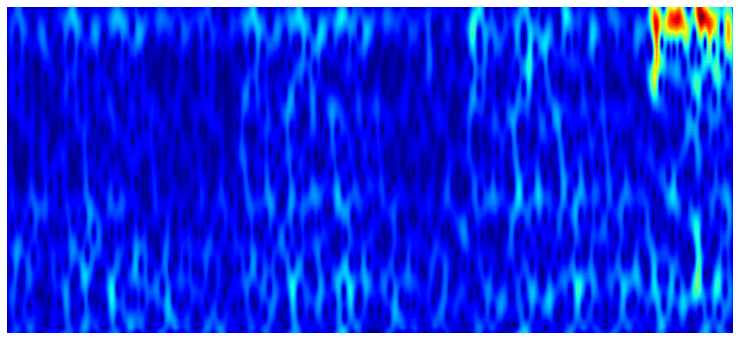

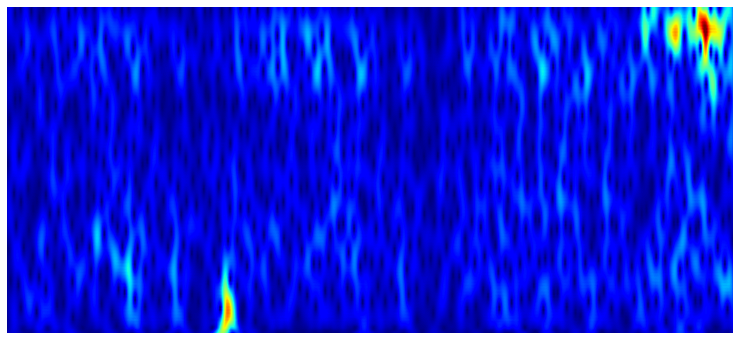

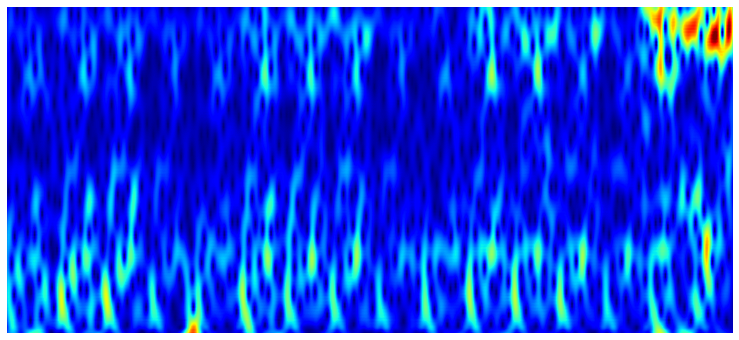

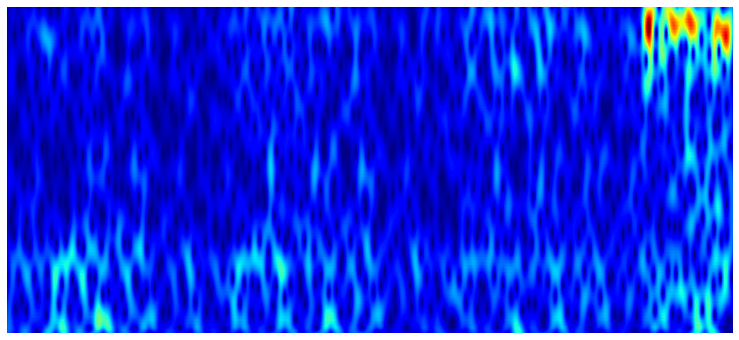

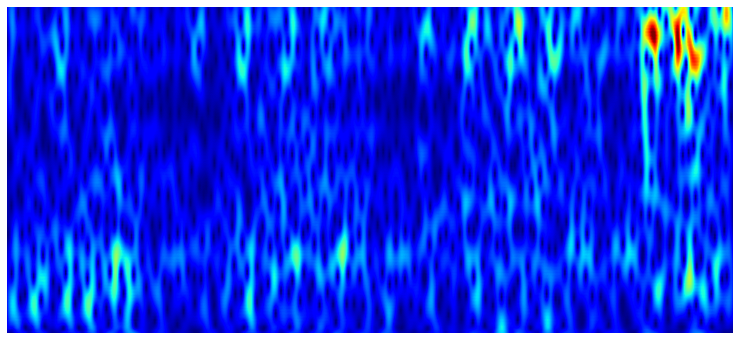

...

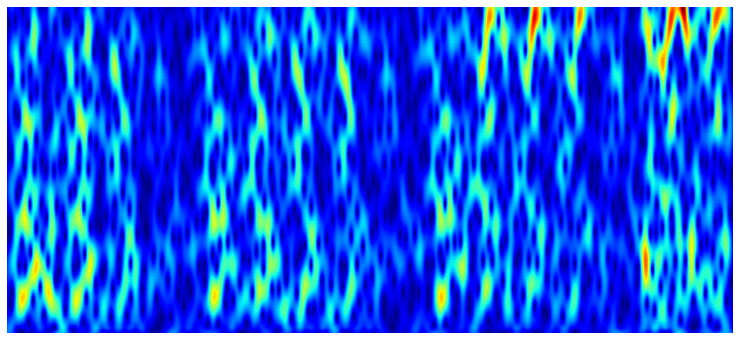

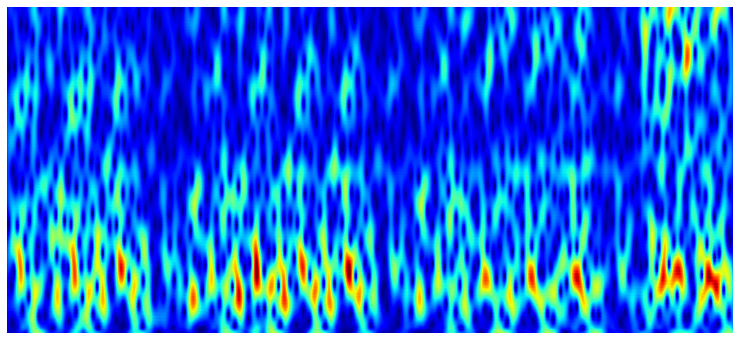

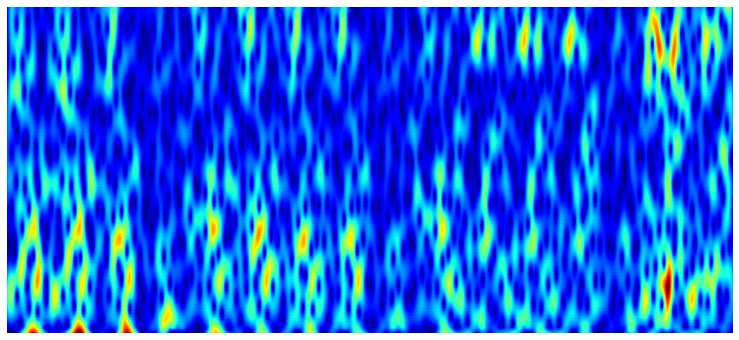

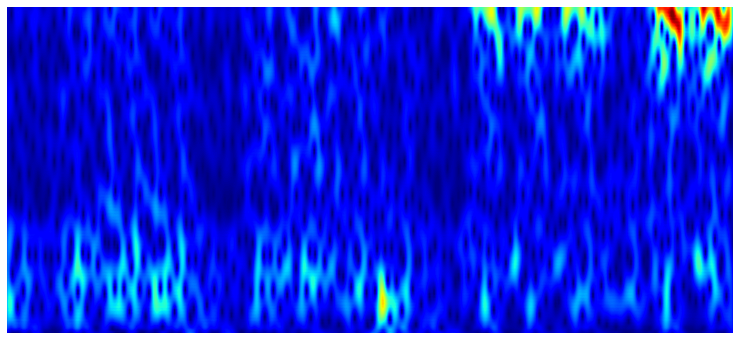

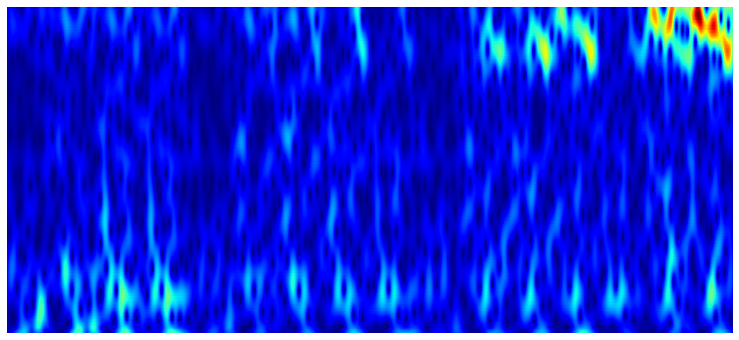

In [ ]:
'''540 window size for cwt 7560/540=14 => about 14 images per test subjects per electrode
In the dataset 84 individuals are there so overall 1176 images per electrode hence total size
of dataset is 18,816 images. The size of each image is about 33kb which means total data set size is 620,928 kb
which is 607 Mb approx. '''

# naming convention of image file is pernum_schiz/norm_electrode number_image window number
#eg- per1_norm_14_8
import os
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import csv
import spkit as sp
num=79
fs = 128
base='channel'
comp_list = get_file_names()
eff_list = comp_list[78:84]
results_dir = '/content/drive/MyDrive/scalograms/scal_images/'
for item in eff_list:
    file = open(item)
    csvreader = csv.reader(file)
    part1='per'+str(num)+'_'
    num+=1
    if 'schizophrenic' in item:
        part2='schiz_'
    elif 'healthy' in item:
        part2='norm_'
    data = []
    for row in csvreader:
        data.append(float(row[0]))
    first = 0
    last = 7560
    electrodes = []
    for i in range(0,16):
        electrodes.append(data[first:last])
        first = last
        last = last+7680


    channel1= []
    channel2= []
    channel3= []
    channel4= []
    channel5= []
    channel6= []
    channel7= []
    channel8= []
    channel9= []
    channel10= []
    channel11= []
    channel12 = []
    
    for item in electrodes:
        counter=1
        final = []
        final = [item[i * 640:(i + 1) * 640] for i in range((len(item) + 640 - 1) // 640)]
        channel1 = channel1 + final[0]
        channel2 = channel2 + final[1]
        channel3 = channel3 + final[2]
        channel4 = channel4 + final[3]
        channel5 = channel5 + final[4]
        channel6 = channel6 + final[5]
        channel7 = channel7 + final[6]
        channel8 = channel8 + final[7]
        channel9 = channel9 + final[8]
        channel10 = channel10 + final[9]
        channel11 = channel11 + final[10]
        channel12 = channel12 + final[11]

    blast = [channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8,channel9,channel10,channel11,channel12]
    for i in range(0,12):
        counter = i+1
        topup=str(counter)
        part3=base+topup+'.png'
        title = results_dir + part1 +part2 +part3
        x = blast[i]
        x = np.asarray(x)
        t = np.arange(len(x))/fs
        f0 = np.linspace(0.1,10,100)
        Q  = np.linspace(0.1,5,100)
        XW,S = ScalogramCWT(x,t,title, fs=fs,wType='Morlet',PlotPSD=True,f0=f0,Q=Q)

In [ ]:
!pip install spkit

     |████████████████████████████████| 1.4 MB 5.2 MB/s 


In [ ]:
'''
Author @ Nikesh Bajaj
Date: 22 Apr 2021
Version : 0.0.1
Github :  https://github.com/Nikeshbajaj/spkit
Contact: n.bajaj@qmul.ac.uk
'''

from __future__ import absolute_import, division, print_function
name = "Signal Processing toolkit | CWT"
import sys

if sys.version_info[:2] < (3, 3):
    old_print = print
    def print(*args, **kwargs):
        flush = kwargs.pop('flush', False)
        old_print(*args, **kwargs)
        if flush:
            file = kwargs.get('file', sys.stdout)
            # Why might file=None? IDK, but it works for print(i, file=None)
            file.flush() if file is not None else sys.stdout.flush()

import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft, ifft, fftshift, ifftshift
from scipy import fftpack
from scipy.special import factorial as Fac
from scipy.special import erf
from scipy.signal import convolve
from scipy import signal

#----------CWT--------------------------------------

def CTFT2(x,fs=128,nfft=None):
    if nfft is None:
        X = fftpack.fftn(x)
    else:
        X = fftpack.fftn(x,[nfft])
    N = len(X)
    f = (fs/N)*(np.arange(N)-N/2)
    return X,f
def iCTFT2(X,fs=128,nfft=None):
    if nfft is None:
        x = fftpack.ifftn(X)
    else:
        x = fftpack.ifftn(X,[nfft])
    N = len(x)
    t = np.arange(N)/fs
    return x,t
def CTFT1(x,t,axis=-1):
    N = len(t)
    Dt = t[1] - t[0]
    Df = 1. / (N * Dt)
    f = Df * (np.arange(N) - N / 2)
    X = Dt * fftshift(fft(x),axes=axis)
    return X,f
def iCTFT1(X,f,axis=-1):
    N = len(f)
    Df = f[1] - f[0]
    Dt = 1. / (N * Df)
    t = Dt * np.arange(N)
    x = ifft(fftshift(X,axes=axis))
    return x,t
def CTFT(x,t, axis=-1, method=1,ignoreWar=False):
    assert t.ndim == 1
    assert x.shape[axis] == t.shape[0]
    N = len(t)
    if not(ignoreWar):
        if N % 2 != 0:
            raise ValueError("number of samples must be even")

    Dt = t[1] - t[0]
    Df = 1. / (N * Dt)
    t0 = t[N // 2]

    f = Df * (np.arange(N) - N / 2)

    shape = np.ones(x.ndim, dtype=int)
    shape[axis] = N
    phase = np.ones(N)
    phase[1::2] = -1
    phase = phase.reshape(shape)
    if method == 1:
        X = Dt * fft(x * phase, axis=axis)
    else:
        X = Dt * fftshift(fft(x, axis=axis), axes=axis)
    X *= phase
    X *= np.exp(-2j * np.pi * t0 * f.reshape(shape))
    X *= np.exp(-1j * np.pi * N / 2)
    return X,f
def iCTFT(X,f, axis=-1, method=1,noshift=False,ignoreWar=False):
    assert f.ndim == 1
    assert X.shape[axis] == f.shape[0]
    N = len(f)
    if not(ignoreWar):
        if N % 2 != 0:
            raise ValueError("number of samples must be even")

    f0 = f[0]
    Df = f[1] - f[0]

    t0 = -0.5 / Df
    if noshift:
        t0=0
    Dt = 1. / (N * Df)
    t = t0 + Dt * np.arange(N)

    shape = np.ones(X.ndim, dtype=int)
    shape[axis] = N

    t_calc = t.reshape(shape)
    f_calc = f.reshape(shape)

    X_prime = X * np.exp(2j * np.pi * t0 * f_calc)
    x_prime = ifft(X_prime, axis=axis)
    x = N * Df * np.exp(2j * np.pi * f0 * (t_calc - t0)) * x_prime
    return x,t
def GaussWave(t,f,f0,Q,t0=0):
    a = (f0 * 1. / Q) ** 2
    Wt = np.exp(-a * (t - t0) ** 2)* np.exp(2j * np.pi * f0 * (t - t0))
    Wf = np.sqrt(np.pi / a)* np.exp(-2j * np.pi * f * t0)* np.exp(-np.pi ** 2 *((f - f0) ** 2)/ a)
    return Wt,Wf
def MorlateWave(t,f=1,sig=1):
    Ks = np.exp(-0.5*sig**2)
    Cs = (1.0 + np.exp(-sig**2) - 2.0*np.exp(-(3.0/4)*sig**2))**(-0.5)
    #Cs=1
    Wt = Cs*(np.pi**(-0.25))*np.exp(-0.5*(t**2))*(np.exp(1j*sig*t)-Ks)

    w=2*np.pi*f
    Wf = Cs*np.pi**(-0.25)*(np.exp(-0.5*(sig-w)**2) - Ks*np.exp(-0.5*w**2) )
    return Wt,Wf
def GaborWave(t,f=1,t0=0,f0=1,a=0.1):
    Wt = np.exp(-((t-t0)**2)/(a**2))*np.exp(-1j*f0*(t-t0))

    Wf = np.exp(-((f-f0)*a)**2)*np.exp(-1j*t0*(f-f0))
    return Wt,Wf
def PoissonWave(t,f=1,n=1,method=1):
    n = n + np.zeros_like(n)
    if method==1:
        tx = t.copy()
        ind = np.where(t<0)[0]
        tx[ind]=0
        if len(np.asarray(n))==1:
            Wt = ((tx-n)/Fac(n))*tx**(n-1)*np.exp(-tx)
            Wt[:,ind] =0
            print(Wt.shape)
        else:
            n =np.asarray(n)
            Wt = ((tx-n[:,None])/Fac(n[:,None]))*tx**(n[:,None]-1)*np.exp(-tx)
            print(Wt.shape)
            Wt[:,ind] =0
        #Wt[ind]=0

        w = 2*np.pi*f
        Wf = -1j*w/(1+1j*w)**(n[:,None]+1)
    elif method==2:
        Wt = (1.0/np.pi)*(1-t**2)/(1+t**2)**2
        w = 2*np.pi*f
        Wf = abs(w)*np.exp(-abs(w))

    elif method==3:
        Wt = (1.0/(2*np.pi))*(1-1j*t)**(-n[:,None]-1)
        w = 2*np.pi*f
        uw = 1.0*(w>=0)
        Wf = (1.0/Fac(n[:,None]))*(w**n[:,None])*np.exp(-w)*uw
    return  Wt,Wf
def cMaxicanHatWave(t,f):
    Wt = (2.0/np.sqrt(3))*(np.pi**(-0.25))*(
        np.sqrt(np.pi)*(1.0-t**2)*np.exp(-0.5*(t**2))
        -( np.sqrt(2)*1j*t + np.sqrt(np.pi)*erf(1j*t/np.sqrt(2))*(1-t**2)*np.exp(-0.5*t**2))
        )

    w1 = 2*np.pi*f
    w = 1.0*(w1>=0)*w1
    #w=w1
    Wf = 2*np.sqrt(2.0/3)*np.pi**(-0.25)*(w**2)*np.exp(-0.5*(w**2))

    #w0 = 2*np.pi*f0
    #w0 = w0 + np.zeros_like(f0)
    #Wf = 2*np.sqrt(2.0/3)*np.pi**(-0.25)*(w0*w**2)*np.exp(-0.25*(w0*w**2))
    #Wf = 2*np.sqrt(2.0/3)*np.pi**(-0.25)*((w-w0[:, None])**2)*np.exp(-0.25*((w-w0[:, None])**2))
    #Wf = 2*np.sqrt(2.0/3)*np.pi**(-0.25)*((w+w0[:, None])**2)*np.exp(-0.25*((w+w0[:, None])**2))
    #Wf = 0.5*Wf1+0.0*Wf2
    return Wt,Wf
def cMaxicanHatWaveV1(t,f,f0=0,a=1):
    Wt = (2.0/np.sqrt(3))*(np.pi**(-0.25))*(
        np.sqrt(np.pi)*(1.0-t**2)*np.exp(-0.5*(t**2))
        -( np.sqrt(2)*1j*t + np.sqrt(np.pi)*erf(1j*t/np.sqrt(2))*(1-t**2)*np.exp(-0.5*t**2))
        )*np.exp(-2*np.pi*1j*f0*t)

    w1 = 2*np.pi*(f-f0)
    w = 1.0*(w1>=0)*w1
    #w=w1

    Wf = 2*np.sqrt(2.0/3)*np.pi**(-0.25)*(w**2)*np.exp(-0.5*a*(w**2))
    return Wt,Wf
def ShannonWave(t,f):
    Wt = np.sinc(t/2)*np.cos(3*np.pi*t/2)
    w =2*np.pi*f
    v1 = (w-3*np.pi/2.0)/np.pi
    v2 = (w+3*np.pi/2.0)/np.pi
    Wf = 1.0*(abs(v1)<=0.5) + 1.0*(abs(v2)<=0.5)
    return Wt,Wf
def ShannonWaveV1(t,f,f0=3.0/4):
    w  = 2*np.pi*f
    w0 = 2*np.pi*f0
    Wt = np.sinc(t/2)*np.cos(w0*t)
    v1 = (w-w0)/np.pi
    v2 = (w+w0)/np.pi
    Wf = 1.0*(abs(v1)<=0.5) + 1.0*(abs(v2)<=0.5)
    return Wt,Wf
def ShannonWaveV2(t,f,f0=3.0/4,fw=0.5):
    w  = 2*np.pi*f
    w0 = 2*np.pi*f0
    Wt = np.sinc(t/2)*np.exp(-2*np.pi*f0*1j*t)
    v1 = (w-w0)/np.pi
    v2 = (w+w0)/np.pi
    Wf = 1.0*(abs(v1)<=fw) + 0.0*(abs(v2)<=fw)
    return Wt,Wf
def WavePSD(x,t,wType='Gauss',PlotW=False,PlotPSD =True,dFFT=False,nFFT=False,reshape=True,**Parameters):
    '''
    1. For Gauss  : f0 =Array, Q=float, t0=float=0, f=Freq Range
    2. For Morlet : sig=Array,                      f=Freq Range
    3. For Gabor  : f0 =Array, a=float, t0=float=0, f=Freq Range
    4. For Poisson: n  =Array,                      f=Freq Range
    5. For Complex MaxicanHat, f0=freq shift        f=Freq Range
    6. For Complex Shannon   , f0=freq shift,fw=BandWidth f=Freq Range
    '''
    N = len(x)
    if dFFT:
        X,f = CTFT1(x,t)
    else:
        X,f = CTFT(x,t)

    if nFFT:
        nfft = 2*N -1
        X,f = CTFT2(x,fs=128,nfft=nfft)

    #N = len(t)
    t1 = t-t[N//2]
    #t1=t
    f1 = Parameters['f'] if ('f' in Parameters.keys() and Parameters['f'] is not None) else f
    #----------Gauss Wavelet------------
    if wType =='Gauss':
        Q  = Parameters['Q']
        f0 = Parameters['f0']
        t0 = Parameters['t0'] if 't0' in Parameters.keys() else 0
        f1 = Parameters['f'] if ('f' in Parameters.keys() and Parameters['f'] is not None) else f

        Wt,Wf = GaussWave(t=t1,f=f1,t0=t0,f0=f0[:,None],Q=Q)
        S=f0

    #----------Morlet Wavelet------------
    elif wType =='Morlet':
        sig = Parameters['sig']
        f1 = Parameters['f'] if ('f' in Parameters.keys() and Parameters['f'] is not None) else f
        t0 = Parameters['t0'] if 't0' in Parameters.keys() else 0
        #t2 = t-t[len(t)//2]
        t2 = t-t0
        Wt,Wf = MorlateWave(t=t1,f=f1,sig=sig[:,None])
        S=sig

    #----------Gabor Wavelet------------
    elif wType =='Gabor':
        a  = Parameters['a']
        f0 = Parameters['f0']
        t0 = Parameters['t0'] if 't0' in Parameters.keys() else 0
        f1 = Parameters['f'] if ('f' in Parameters.keys() and Parameters['f'] is not None) else f

        Wt,Wf =GaborWave(t=t1,f=f1,f0=f0[:,None],a=a,t0=t0)
        S=f0

    #----------Poisson Wavelet------------
    elif wType=='Poisson':
        method = Parameters['method']
        n = Parameters['n']
        f1 = Parameters['f'] if ('f' in Parameters.keys() and Parameters['f'] is not None) else f
        Wt,Wf = PoissonWave(t=t1,f=f1,n=n,method=method)
        S=n

    elif wType=='cMaxican':
        f0 = Parameters['f0'] if ('f0' in Parameters.keys() and Parameters['f0'] is not None) else np.arange(5)[:,None]
        a = Parameters['a'] if 'a' in Parameters.keys() else 1.0
        print(a)
        Wt,Wf = cMaxicanHatWaveV1(t=t1,f=f1,f0=f0,a=a)
        S = f0
    elif wType=='cShannon':
        f0 = Parameters['f0'] if ('f0' in Parameters.keys() and Parameters['f0'] is not None) else 0.1*np.arange(10)[:,None]
        fw = Parameters['fw'] if 'fw' in Parameters.keys() else 0.5
        Wt,Wf = ShannonWaveV2(t=t1,f=f1,f0=f0,fw=fw)
        S = f0
    else:
        raise ValueError('Wavelet type was not recognized.')
        print('Wavelet type was not recognized')

    if nFFT:
        #XWf = X*np.conj(fftshift(Wf,axes=-1))
        #XW,ty = iCTFT2(XWf,fs=128,nfft=None)
        #XW = XW[:,:x.shape[0]]

        Wf1 = fftshift(Wf,axes=-1)
        xw = ifft(X*np.conj(Wf1))
        if reshape:
            XW = xw[:,:x.shape[0]]
        else:
            XW = xw
    else:
        if dFFT:
            #XW,ty = iCTFT1(X*np.conj(Wf),f)
            XW1 = X*np.conj(Wf)
            print(XW1.shape)
            XW = fftpack.ifftn(XW1,shape=[2*X.shape[0]-1],axes=[-1])
            if reshape:
                XW = XW[:,:x.shape[0]]
            ty = np.arange(XW.shape[1])/128.0

        else:
            XW,ty = iCTFT(X*np.conj(Wf),f)

    if PlotW:
        plt.figure(figsize=(13,6))
        plt.subplot(221)
        plt.plot(t,Wt.T.real)
        plt.plot(t,Wt.T.imag)
        plt.xlim([t[0],t[-1]])
        plt.subplot(222)
        plt.plot(f,abs(Wf).T)
        plt.xlim([f[0],f[-1]])
        plt.subplot(224)
        plt.plot(f,np.angle(Wf).T)
        plt.xlim([f[0],f[-1]])
        plt.show()
    if PlotPSD:
        plt.figure(figsize=(13,6))
        plt.subplot(211)
        plt.plot(t,x)
        plt.xlim([t[0],t[-1]])
        plt.subplot(212)
        plt.imshow(abs(XW),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S[0], S[-1]],interpolation='sinc' )
        #plt.subplot(313)
        #plt.imshow(np.angle(XW),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S[0], S[-1]],interpolation='sinc' )
        plt.show()

    return XW,S
def ScalogramCWT(x,t,title,wType='Gauss',fs=128,PlotPSD=False,PlotW=False,fftMeth=True,interpolation='sinc',**Parameters):
    '''
    Compute scalogram using Continues Wavelet Transform for wavelet type (wType) and given scale range
    Parameters
    ----------
    x: array-like, input signal,
    t: array-like, time array corresponding to x, same length as x
    fs: sampling rate
    PlotPSD: bool, if True, plot Scalogram
    PlotW :  bool, if True, plot wavelets in time and frequecy with different scalling version
    fftMeth: if True, FFT method is used, else convolution method is used. FFT method is faster.
    interpolation: str, or None, interpolation while ploting Scalogram.
    Parameters for different wavelet functions
    --------
    Common Parameters for all the Wavelet functions
    f : array of frequency range to be analysed, e.g. np.linspace(-10,10,2*N-1), where N = len(x)
      : if None, frequency range of signal is considered from -fs/2 to fs/2
      : ( fs/n1*(np.arange(n1)-n1/2))
    A list of wavelets will be generated for each value of scale (e.g. f0, sigma, n etc)
    1. Gauss: (wType =='Gauss')
        f0 = array of center frquencies for wavelets, default: np.linspace(0.1,10,100) [scale value]
        Q  = float or array of q-factor for each wavelet, e.g. 0.5 (default) or np.linspace(0.1,5,100)
           : if array, should be of same size as f0
        t0 = float=0, time shift of wavelet, or phase shift in frquency, Not suggeestive to change
    2. For Morlet: (wType =='Morlet')
        sig = array of sigma values for morlet wavelet, default: np.linspace(0.1,10,100) [scale value]
        fw = array of frequency range, e.g. np.linspace(-10,10,2*N-1), where N = len(x)
        ref: https://en.wikipedia.org/wiki/Morlet_wavelet
    3. For Gabor: (wType =='Gabor')
        Gauss and Gabor wavelet are essentially same
        f0 = array of center frquencies for wavelets, default: np.linspace(1,40,100) [scale value]
        a  = float, oscillation parameter, default 0.5,
             could be an array (not suggeestive), similar to Gauss, e.g np.linspace(0.1,1,100) or np.logspace(0.001,0.5,100)
        t0 = float=0, time shift of wavelet, or phase shift in frquency. Not suggeestive to change
    4. For Poisson: (wType=='Poisson')
        n  = array of intergers, default np.arange(100), [scale value]
        method = 1,2,3, different implementation of Poisson funtion, default 3
        keep the method=3, other methods are under development and not exactly compatibile with framework yet,
        ref: https://en.wikipedia.org/wiki/Poisson_wavelet
    5. For Complex MaxicanHat: (wType=='cMaxican')
        f0 = array of center frquencies for wavelets, default: np.linspace(1,40,100) [scale value]
        a  = float, oscillation parameter, default 1.0, could be an array (not suggeestive)
        ref: https://en.wikipedia.org/wiki/Complex_Mexican_hat_wavelet
    6. For Complex Shannon: (wType=='cShannon')
        f0 = array of center frquencies for wavelets, default: 0.1*np.arange(10) [scale value],
        fw = BandWidth each wavelet, default 0.5, could be an array (not suggeestive)
        ref: https://en.wikipedia.org/wiki/Shannon_wavelet
    Returns
    -------
    XW: Complex-valued matrix of time-scale - Scalogram, with shape (len(S), len(x)). scale vs time
    S :  scale values
    Examples
    --------
    import numpy as np
    import matplotlib.pyplot as plt
    from spkit.cwt import ScalogramCWT
    # Example 1 - EEG Signal
    import spkit as sp
    from spkit.cwt import compare_cwt_example
    x,fs = sp.load_data.eegSample_1ch()
    t = np.arange(len(x))/fs
    print(x.shape, t.shape)
    compare_cwt_example(x,t,fs=fs)
    # Example 2.1 - different wavelets
    XW,S = ScalogramCWT(x,t,fs=fs,wType='Gauss',PlotPSD=True)
    # Example 2.2 - set scale values and number of points
    nS = 100
    f0 = np.linspace(0.1,10,nS) # range of scale values - frquency
    Q  = np.linspace(0.1,5,nS)  # different q-factor for each scale value
    # Q = 0.5
    XW,S = ScalogramCWT(x,t,fs=fs,wType='Gauss',PlotPSD=True,f0=f0,Q=Q)
    # Example 2.3  - plot scalled wavelets too
    XW,S = ScalogramCWT(x,t,fs=fs,wType='Gauss',PlotPSD=True,PlotW=True,f0=f0,Q=Q)
    # Example 3
    t = np.linspace(-5, 5, 10*100)
    x = (np.sin(2*np.pi*0.75*t*(1-t) + 2.1) + 0.1*np.sin(2*np.pi*1.25*t + 1) + 0.18*np.cos(2*np.pi*3.85*t))
    xn = x + np.random.randn(len(t)) * 0.5
    XW,S = ScalogramCWT(xn,t,fs=100,wType='Gauss',PlotPSD=True)
    # Example 4
    f0 = np.linspace(0.1,30,100)
    Q  = np.linspace(0.1,5,100) # or = 0.5
    XW,S = ScalogramCWT(xn,t,fs=128,wType='Gauss',PlotPSD=True,f0=f0,Q=Q)
    '''
    N  = len(x)
    n1 = 2*N-1   # considering both signal to be N length, convolutional legth n1 = N+N-1
    f = fs/n1*(np.arange(n1)-n1/2)

    if fftMeth: X = fft(x,n=n1)

    t1 = t-t[N//2] # time length for wavelets
    f1 = Parameters['f'] if ('f' in Parameters and Parameters['f'] is not None) else f
    t0 = Parameters['t0'] if 't0' in Parameters else 0

    #----------Gauss Wavelet------------
    if wType =='Gauss':
        Q     = Parameters['Q'] if 'Q' in Parameters else 0.5
        f0    = Parameters['f0'] if 'f0' in Parameters else np.linspace(0.1,10,100)

        if isinstance(Q,np.ndarray) and Q.ndim==1: Q = Q[:,None]

        Wt,Wf = GaussWave(t=t1,f=f1,t0=t0,f0=f0[:,None],Q=Q)
        S=f0

    #----------Morlet Wavelet------------
    elif wType =='Morlet':
        sig   = Parameters['sig'] if 'sig' in Parameters else np.linspace(0.1,10,100)
        fw    = Parameters['fw'] if ('fw' in Parameters and Parameters['fw'] is not None) else np.linspace(-10,10,2*N-1)
        Wt,Wf = MorlateWave(t=t1,f=fw,sig=sig[:,None])
        S=sig

    #----------Gabor Wavelet------------
    elif wType =='Gabor':
        a     = Parameters['a'] if 'a' in Parameters else 0.5
        f0    = Parameters['f0'] if 'f0' in Parameters else np.linspace(1,40,100)
        if isinstance(a,np.ndarray) and a.ndim==1: a = a[:,None]
        Wt,Wf = GaborWave(t=t1,f=f1,f0=f0[:,None],a=a,t0=t0)
        S=f0

    #----------Poisson Wavelet------------
    elif wType=='Poisson':
        method = Parameters['method'] if 'method' in Parameters else 3
        n      = Parameters['n'] if 'n' in Parameters else np.arange(100)
        Wt,Wf  = PoissonWave(t=t1,f=f1,n=n,method=method)
        S=n

    elif wType=='cMaxican':
        f0 = Parameters['f0'] if ('f0' in Parameters and Parameters['f0'] is not None) else np.arange(5)
        a = Parameters['a'] if 'a' in Parameters else 1.0
        if isinstance(a,np.ndarray) and a.ndim==1: a = a[:,None]
        Wt,Wf = cMaxicanHatWaveV1(t=t1,f=f1,f0=f0[:,None],a=a)
        S = f0
    elif wType=='cShannon':
        f0 = Parameters['f0'] if ('f0' in Parameters.keys() and Parameters['f0'] is not None) else 0.1*np.arange(10)
        fw = Parameters['fw'] if 'fw' in Parameters.keys() else 0.5
        Wt,Wf = ShannonWaveV2(t=t1,f=f1,f0=f0[:,None],fw=fw)
        S = f0
    else:
        raise ValueError('Wavelet type was not recognized.')
        print('Wavelet type was not recognized')


    if fftMeth:
        #print(X.shape,x.shape,Wf.shape)
        Wf = fftshift(Wf,axes=-1)
        xw = ifft(X*np.conj(Wf))
        XW = xw[:,:x.shape[0]]
    else:
        XW = Centered(convolve(x[None,:],Wt),[Wt.shape[0],x.shape[0]])


    #print(XW.shape)

    if PlotW:
        plt.figure(figsize=(13,3))
        plt.subplot(121)
        plt.plot(t,Wt.T.real)
        plt.plot(t,Wt.T.imag)
        plt.xlim([t[0],t[-1]])
        plt.xlabel('time')
        plt.title('Wavelets at diff. scale')
        plt.subplot(122)
        #plt.plot(f,abs(Wf).T)
        #plt.xlim([f[0],f[-1]])
        plt.plot(f-f[0],abs(Wf).T)
        plt.xlim([0,f[-1]])
        #plt.subplot(224)
        #plt.plot(f,np.angle(Wf).T)
        #plt.xlim([f[0],f[-1]])
        plt.xlabel('frequency')
        plt.title('Wavelets at diff. scale')
        plt.show()
    if PlotPSD:
        plt.figure(figsize=(13,6))
        plt.xlim([t[0],t[-1]])
        plt.imshow(abs(XW),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S[0], S[-1]],interpolation=interpolation )
        #plt.subplot(313)
        #plt.imshow(np.angle(XW),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S[0], S[-1]],interpolation='sinc' )
        plt.axis('off')
        plt.savefig(title, bbox_inches='tight',pad_inches = 0)

    return XW,S
def Centered(arr, newshape):
    # Return the center newshape portion of the array.
    newshape = np.asarray(newshape)
    currshape = np.array(arr.shape)
    startind = (currshape - newshape) // 2
    endind = startind + newshape
    myslice = [slice(startind[k], endind[k]) for k in range(len(endind))]
    return arr[tuple(myslice)]


def compare_cwt_example(x,t,fs=128,sLog =False):
    t1 = t
    t0 = 0

    #print('Gauss')
    f0 = np.linspace(0.1,40,100)
    Q  = np.linspace(0.1,5,100)#[:,None]
    XW1,S1 = ScalogramCWT(x,t,wType='Gauss',fs =fs,PlotW=False,PlotPSD =False,fftMeth=True,f0=f0,Q=Q)

    #print('Morlet')
    sig = np.linspace(0.1,10,100)
    f = np.linspace(-10,10,2*len(x)-1)
    XW2,S2 = ScalogramCWT(x,t,wType='Morlet',fs =fs,PlotW=False,PlotPSD =False,fftMeth=True,sig=sig,f=f)

    #print('Gabor')
    f0 = np.linspace(1,40,100)
    a  = 0.5
    XW3,S3 = ScalogramCWT(x,t,wType='Gabor',fs =fs,PlotW=False,PlotPSD =False,fftMeth=True,f0=f0,a=a)

    #print('Poisson')
    n = np.arange(100)
    XW4,S4 = ScalogramCWT(x,t,wType='Poisson',fs =fs,PlotW=False,PlotPSD =False,fftMeth=True,n=n,method=3)

    #print('cMaxican')
    f0 = np.linspace(0,40,80)#[:,None]
    a  = 0.005
    XW5,S5 = ScalogramCWT(x,t,wType='cMaxican',fs =fs,PlotW=False,PlotPSD =False,fftMeth=True,f0=f0,a=a)

    #print('cShannon')
    f0 = np.linspace(0,40,40)#[:,None]
    fw=5
    XW6,S6 = ScalogramCWT(x,t,wType='cShannon',fs = 128,PlotW=False,PlotPSD =False,fftMeth=True,f0=f0,fw=fw)

    N=32
    win = signal.get_window('hann', N)
    fx, tx, Sxx = signal.spectrogram(x, fs=fs,nfft=2*N,nperseg=N,noverlap=N//2,window=win)

    plt.figure(figsize=(15,15))
    plt.subplot(811)
    #print(x.shape,t.shape)
    plt.plot(t,x)
    plt.xlim([t[0],t[-1]])
    plt.grid()

    plt.subplot(812)
    plt.imshow(abs(XW1),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S1[0], S1[-1]],interpolation='sinc')
    plt.ylabel('Gauss')

    plt.subplot(813)
    plt.imshow(abs(XW2),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S2[0], S2[-1]],interpolation='sinc')
    plt.ylabel('Morlet')

    plt.subplot(814)
    plt.imshow(abs(XW3),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S3[0], S3[-1]],interpolation='sinc')
    plt.ylabel('Gabor')

    plt.subplot(815)
    plt.imshow(abs(XW4),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S4[0], S4[-1]],interpolation='sinc')
    plt.ylabel('Poisson')

    plt.subplot(816)
    plt.imshow(abs(XW5),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S5[0], S5[-1]],interpolation='sinc')
    plt.ylabel('cMaxican')

    plt.subplot(817)
    plt.imshow((abs(XW6)),aspect='auto',origin ='lower', cmap=plt.cm.jet, extent=[t[0], t[-1], S6[0], S6[-1]],interpolation='sinc')
    plt.ylabel('cShannon')

    plt.subplot(818)
    if sLog:
        plt.imshow(np.log10(Sxx),aspect='auto',  origin='lower',cmap=plt.cm.jet, extent=[t[0], t[-1], fx[0], fx[-1]],interpolation='sinc')
    else:
        plt.imshow(Sxx,aspect='auto',  origin='lower',cmap=plt.cm.jet, extent=[t[0], t[-1], fx[0], fx[-1]],interpolation='sinc')
    plt.ylabel('Spectrogram')

    plt.subplots_adjust(hspace=0.05)
    plt.show()

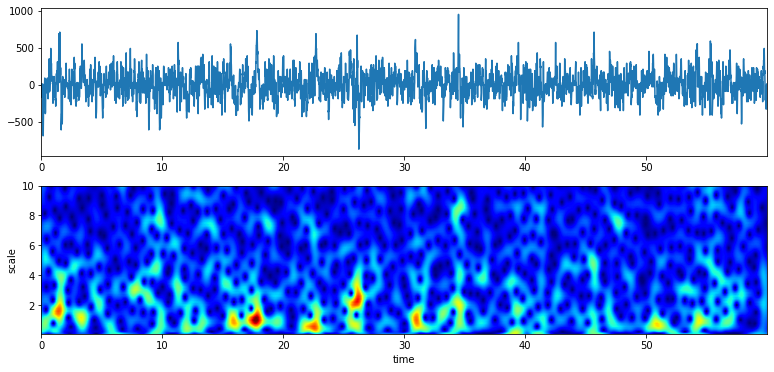

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import spkit as sp
fs = 128
x = 
x = np.asarray(x)
t = np.arange(len(x))/fs
print(x.shape, t.shape)
compare_cwt_example(x,t,fs=fs)
f0 = np.linspace(0.1,10,100)
Q  = np.linspace(0.1,5,100)
XW,S = ScalogramCWT(x,t,fs=fs,wType='Gauss',PlotPSD=True,f0=f0,Q=Q)


## **6. Training the moving window scalogram**



In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import os
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np

def load_images(path):
    image = tf.io.read_file(path)
    image = tf.io.decode_jpeg(image)
    image = image[:,:,:3]
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, (326,725))
    image = image/255.0
    return image


In [ ]:
from os import listdir
import numpy as np
from skimage import data, io, filters
filebefore = '/content/drive/MyDrive/scal_images/'
elec_1_list = [f for f in listdir('/content/drive/MyDrive/scal_images/') ]
Y = [] 
X = []
total=len(elec_1_list)
i=1
for item in elec_1_list:
    indices = item.split('_')
    index = indices[1]
    if index=='norm':
        label = 0
    else:
        label = 1
    Y.append(label)
    sample_path = filebefore+item
    x = load_images(sample_path)
    X.append(x)
    #print("item "+str(i)+"of "+str(total)+"done"+"\n")
    i+=1

In [ ]:
import numpy
X_arr = numpy.array(X)
Y_arr = numpy.array(Y)

In [ ]:
from keras.layers import *
from keras.models import Sequential
from os import listdir
model = Sequential()

model.add(Conv2D(32,(3,3),activation='relu',input_shape=(326,725,3)))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(MaxPooling2D(2,2))

model.add(Flatten())
#This is further sent into a MLP
model.add(Dense(64,activation='relu'))
model.add(Dense(2,activation='softmax'))
ans = model.summary()
print(ans)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 324, 723, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 162, 361, 32)     0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 160, 359, 64)      18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 80, 179, 64)      0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 916480)            0         
                                                                 
 dense_2 (Dense)             (None, 64)               

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_arr, Y_arr, test_size=0.20)

In [ ]:
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:
#training the model
model.fit(X_train,y_train,epochs=50,validation_split=0.1,batch_size=16)

Epoch 1/50
13/13 [==============================] - 3s 253ms/step - loss: 0.2748 - accuracy: 0.9637 - val_loss: 0.1018 - val_accuracy: 0.9545
Epoch 2/50
13/13 [==============================] - 3s 251ms/step - loss: 0.0874 - accuracy: 0.9793 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 3/50
13/13 [==============================] - 3s 250ms/step - loss: 0.0200 - accuracy: 0.9948 - val_loss: 0.0060 - val_accuracy: 1.0000
Epoch 4/50
13/13 [==============================] - 3s 252ms/step - loss: 0.0052 - accuracy: 1.0000 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 5/50
13/13 [==============================] - 3s 251ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 6/50
13/13 [==============================] - 3s 251ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 7.9094e-04 - val_accuracy: 1.0000
Epoch 7/50
13/13 [==============================] - 3s 251ms/step - loss: 9.1822e-04 - accuracy: 1.0000 - val_loss: 6.1402e-04 - val_accuracy: 1

In [ ]:
model.evaluate(X_test,y_test)

2/2 [==============================] - 1s 152ms/step - loss: 0.3302 - accuracy: 0.9444


[0.33018800616264343, 0.9444444179534912]

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
y = []
for i in range(len(y_pred)):
  if y_pred[i][0]>=0.5:
    y.append(0)
  else:
    y.append(1)

## **7. Accuracy evaluation of the window scalogram (final) method**



In [ ]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y)
cf_matrix

array([[25,  2],
       [ 1, 26]])

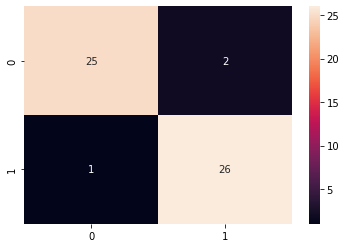

In [ ]:
import seaborn as sns
sns.heatmap(cf_matrix, annot=True)

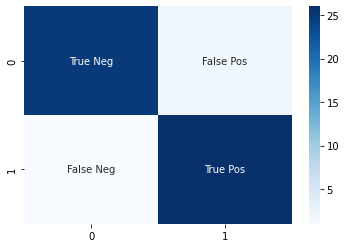

In [ ]:
labels = ["True Neg","False Pos","False Neg","True Pos"]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')

In [ ]:
from re import T
TP = cf_matrix[1][1]
TN = cf_matrix[0][0]
FP = cf_matrix[0][1]
FN = cf_matrix[1][0]

Accuracy = (TP + TN) / All Predictions

Sensitivity (Recall) = TP / (FN + TP)

Specificity = TN / (TN + FP)

Precision/Positive Predictive Value = TP / (TP + FP)

F1 Score = 2 * (Precision * Sensitivity) / (Precision + Sensitivity)

Negative Predictive Value = TN/(TN+FN)



In [ ]:
accuracy = ((TP+TN)/y_test.shape)*100
print("accuracy: ", accuracy)

accuracy:  [94.44444444]


In [ ]:
sensitivity = TP/(FN+TP)
print("sensitivity: ", sensitivity)

sensitivity:  0.9629629629629629


In [ ]:
specificity = TN / (TN+FP)
print("specificity: ", specificity)

specificity:  0.9259259259259259


In [ ]:
#Precision/Positive Predictive Value 
PPV = TP / (TP + FP)
print("Precision/Positive Predictive Value: ", PPV)

Precision/Positive Predictive Value:  0.9285714285714286


In [ ]:
#F1 Score 
f1 = 2 * (PPV * sensitivity) / (PPV + sensitivity)
print("F1 Score: ", f1)

F1 Score:  0.9454545454545454


In [ ]:
#Negative Predictive Value 
NPV = TN/(TN+FN)
print("Negative Predictive Value: ", NPV)

#output: nan as TN=0 and FN=0

Negative Predictive Value:  0.9615384615384616


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y)

0.9444444444444444

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y))

              precision    recall  f1-score   support

           0       0.96      0.93      0.94        27
           1       0.93      0.96      0.95        27

    accuracy                           0.94        54
   macro avg       0.95      0.94      0.94        54
weighted avg       0.95      0.94      0.94        54



In [ ]:
model.save('/content/drive/MyDrive/Major_Project/final')